<a href="https://colab.research.google.com/github/iRaez/applied_datascience_capstone/blob/main/data_science_cap_proj_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Table of contents
1. [Introduction](#introduction)
    1. [Project Scope](#bizundr)
2. [Methodology](#methodology)
    1. [Data Requirements](#datareq)
    2. [Data Source](#datasauce)
    3. [Data Visualisation](#dataviz)
    4. [Modeling to Evaluation](#modeleval)
3. [Results](#results)
4. [Discussion](#disc)
5. [Conclusion](#conc)
6. [References](#ref)
7. [Acknowledgments](#ack)
8. [Appendix](#appendix)

# Introduction <a name="introduction"></a>

<H2>Introduction to the company in this capstone project</H2>

*note: as this project will deal with an actual company, I am leaving out or replacing some details.*

The company in this project is from the Food & Beverage industry and it is a for profit company that reserves a portion of its profits for social purposes. It provides coffee services in both traditional brick and mortar format as well as online retail shops. This company also has a central mission to be able to provide opportunities for the marginalised in society by empowering them through employability skills training as well as working with industry partners to provide employment. In order to not be a source of potentially disclosing any corporate secrets, the company in this project will be referred to as "Bev Company".

### Scope of the project <a name="bizundr"></a>
*A description of the problem and a discussion of the background. (15 marks)*

The recent global pandemic let to many governments enforcing a almost complete shutdown of all services aside from essential ones. 

One of the hardest hit industries were the Food & Beverage industry. 
In my country of residence, there was a "Cordon sanitaire". This resulted in only essential services to be kept in operation. Many F&B businesses were hit and forced to go out of business

Companies found themselves having to get creative, and among them, Bev Company, had made changes to some of the services they offer in order to adapt to the volatile and uncertain times.
The current trend right now within the coffee industry in my country of residence is that we find an increase in home delivery of coffee products or equipment as many corporate employees now find themselves working from home and needing their coffee fix.

### Understanding the Problem

Now with majority of office workers having to continue working from home, the retail outlets that provide Bev Company's specialty coffee to them are either under utilised or not all. Bev Company has shifted and is focusing on being able to maintain and provide the same quality specialty coffee to their partners and consumers via online methods. 

Part of being able to do so requires them to understand certain things about their customers, chief of which is the general location they make these purchases or subscriptions from, and their purchase preferences. 
The problem to be addressed is how can their services be provided to their customers in a timely manner that will ensure freshness that is up to their service standards.
The other issue that should be addressed is to still maintain the core of being able to provide sustainable employment to their beneficiaries.

# Methodology <a name="methodology"></a>

### Data Requirements <a name="datareq"></a>

*A description of the data and how it will be used to solve the problem. (15 marks)*

In order to provide a solution, the sort of data that would need to be collected is largely geolocation data of:

* Residential or commerical properties 
* Location of amenities in residential areas, specifically cafes or restaurents that provide coffee services

The other type of data required would be:
* Services and products purchased from current Bev Company customers
* Frequency or quantity of these products and services.

How the data would be used to address the question would be as follows:

* Knowing where the bulk of the products are purchased from would allow me to be able to narrow down places where Bev Company could focus resources in establishing a satellite kitchen or partnering with an existing business to provide Bev Company's coffee that meets their quality standards. Geolocation data of existing customers would help visualise that.
* Knowing where the existing amenities in residential areas would allow me to also find under served areas which could be potentially places where Bev Company could set up pop up brewing services as a way to increase brand awareness or availability.
* The frequency and quantity would help me know where are the hotspots that would better inform the locations Bev Company could focus on.


### Data Source <a name="datasauce"></a>

There will be data from Bev Company that would contain the information on their current customers. As some of the data would be proprietary and private, I will legally not be able to include them in this notebook. However, the data that is open-sourced would be included. More information on the data source will be given in the final submission of this project.

#### Import modules

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install geopy
!pip install geopandas
!pip install hdbscan

!apt-get install libproj-dev proj-data proj-bin
!apt-get install libgeos-dev
!pip install cython
!pip install cartopy
!pip install alphashape

In [ ]:
## for plotting
import matplotlib
import matplotlib.cm as cm
import matplotlib.colors as colors
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import seaborn as sns
import descartes

## for data
import pandas as pd
import numpy as np
import geopandas as gpd

from tqdm import tqdm

## for machine learning
from sklearn import preprocessing, cluster
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.datasets import make_blobs
from sklearn.neighbors import KNeighborsClassifier
import scipy
import hdbscan

## for geospatial
import folium
import geopy
import shapely
import alphashape

import re
import json
from ipywidgets import interactive
import requests # library to handle requests
import gzip

#from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

# libraries for displaying images
#from IPython.display import Image, JSON 
#from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

cols = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4',
        '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', 
        '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', 
        '#000075', '#808080']*10

###### KEEP SECRET
delete before publishing to Github

In [ ]:
#@hidden_cell
CLIENT_ID = 'CLIENT_ID' # your Foursquare ID
CLIENT_SECRET = 'CLIENT_SECRET' # your Foursquare Secret
ACCESS_TOKEN = 'ACCESS_TOKEN' # your FourSquare Access Token
VERSION = '20180604'
LIMIT =50

G_API_KEY = 'G_API_KEY'
geoapi = 'https://www.googleapis.com/geolocation/v1/geolocate?key=G_API_KEY'

#### Clean masterplan file to get relevant information

In [ ]:
mdf = gpd.read_file('/content/drive/MyDrive/Bettr/Capstone project/master-plan-2019-subzone-boundary-no-sea-geojson.geojson')

In [ ]:
from bs4 import BeautifulSoup as bs

In [ ]:
data = mdf['Description'].iloc[0]
data

'<center><table><tr><th colspan=\'2\' align=\'center\'><em>Attributes</em></th></tr><tr bgcolor="#E3E3F3"> <th>SUBZONE_NO</th> <td>1</td> </tr><tr bgcolor=""> <th>SUBZONE_N</th> <td>MARINA EAST</td> </tr><tr bgcolor="#E3E3F3"> <th>SUBZONE_C</th> <td>MESZ01</td> </tr><tr bgcolor=""> <th>CA_IND</th> <td>Y</td> </tr><tr bgcolor="#E3E3F3"> <th>PLN_AREA_N</th> <td>MARINA EAST</td> </tr><tr bgcolor=""> <th>PLN_AREA_C</th> <td>ME</td> </tr><tr bgcolor="#E3E3F3"> <th>REGION_N</th> <td>CENTRAL REGION</td> </tr><tr bgcolor=""> <th>REGION_C</th> <td>CR</td> </tr><tr bgcolor="#E3E3F3"> <th>INC_CRC</th> <td>4FB7E5B1B9455DE0</td> </tr><tr bgcolor=""> <th>FMEL_UPD_D</th> <td>20191223152313</td> </tr></table></center>'

Get table header to make into column names

In [ ]:
data = mdf['Description'].iloc[0]
soup = bs(data,"html.parser")
ths = soup.find_all("th")
dfcol = []
for th in ths:
    inner_text = th.text
    dfcol.append(inner_text)
dfcol

['Attributes',
 'SUBZONE_NO',
 'SUBZONE_N',
 'SUBZONE_C',
 'CA_IND',
 'PLN_AREA_N',
 'PLN_AREA_C',
 'REGION_N',
 'REGION_C',
 'INC_CRC',
 'FMEL_UPD_D']

In [ ]:
data = mdf['Description'].iloc[4]
soup = bs(data,"html.parser")
tds = soup.find_all("td")
dfcol2 = []
for td in tds:
    inner_text = td.text
    dfcol2.append(inner_text)
dfcol2

['2',
 'FORT CANNING',
 'MUSZ02',
 'Y',
 'MUSEUM',
 'MU',
 'CENTRAL REGION',
 'CR',
 '8E8F2616FFA9E019',
 '20191223152313']

From above, the only data I am mainly interested in is name of the zone, and the code.

In [ ]:
subzone_name = []
pln_name = []
pln_code = []
reg_name = []
reg_code = []

In [ ]:
for data in mdf['Description']:
  soup = bs(data,"html.parser")
  tds = soup.find_all("td")
  dfcol = []
  for td in tds[1:8]:
    inner_text = td.text
    dfcol.append(inner_text)
  subzone_name.append(dfcol[0])
  pln_name.append(dfcol[3])
  pln_code.append(dfcol[4])
  reg_name.append(dfcol[5])
  reg_code.append(dfcol[6])
mdf['subzone_name'] = subzone_name
mdf['plan_area_name'] = pln_name
mdf['plan_area_code'] = pln_code
mdf['region_name'] = reg_name
mdf['region_code'] = reg_code
mdf.head()

,Name,Description,geometry,subzone_name,plan_area_name,plan_area_code,region_name,region_code
0,kml_1,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.88025 1.28386 0.00000, 103.880...",MARINA EAST,MARINA EAST,ME,CENTRAL REGION,CR
1,kml_2,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83764 1.29560 0.00000, 103.837...",INSTITUTION HILL,RIVER VALLEY,RV,CENTRAL REGION,CR
2,kml_3,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.83410 1.29248 0.00000, 103.834...",ROBERTSON QUAY,SINGAPORE RIVER,SR,CENTRAL REGION,CR
3,kml_4,<center><table><tr><th colspan='2' align='cent...,"MULTIPOLYGON Z (((103.71253 1.29163 0.00000, 1...",JURONG ISLAND AND BUKOM,WESTERN ISLANDS,WI,WEST REGION,WR
4,kml_5,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.84718 1.29700 0.00000, 103.847...",FORT CANNING,MUSEUM,MU,CENTRAL REGION,CR


In [ ]:
print(mdf['geometry'].iloc[50])

POLYGON Z ((103.791457383524 1.30777650885682 0, 103.791530479796 1.30753935496121 0, 103.791550154548 1.30747552253083 0, 103.791419353684 1.30743423609711 0, 103.791647642545 1.30665242403673 0, 103.791648493495 1.30665086854397 0, 103.791648622889 1.30665063069827 0, 103.791772316113 1.30642434357567 0, 103.791772334085 1.30642431011449 0, 103.792257809216 1.30553617249558 0, 103.79225796107 1.30553624394289 0, 103.792521528187 1.30509069136961 0, 103.792521567724 1.30509059731633 0, 103.792532484534 1.30506777585552 0, 103.792546648747 1.30504154680206 0, 103.792546743996 1.30504136954816 0, 103.792576284595 1.30498666773229 0, 103.792576349292 1.30498654745287 0, 103.792590366137 1.30496059241917 0, 103.792768529293 1.30460863653368 0, 103.792772332079 1.30460005417586 0, 103.792772502809 1.30459966891935 0, 103.792776562589 1.30459050777239 0, 103.79277658056 1.30459046707628 0, 103.792782235317 1.30457770658431 0, 103.792782250593 1.30457767221869 0, 103.792782881395 1.304576249

In [ ]:
#Plotting to see how the polygons look like on the map
m = folium.Map(location=[1.28967, 103.85007], zoom_start=11)

folium.GeoJson(mdf).add_to(m)

m

### Next
Using postal code data from a [github repo](https://github.com/xuancong84/singapore-address-heatmap).

In [ ]:
#with gzip.open('/content/drive/MyDrive/Bettr/Capstone project/database.csv.gz') as df:

postcode_df = pd.read_csv("/content/drive/MyDrive/Bettr/Capstone project/sgpadd_new.csv")
postcode_df.head()

,ADDRESS,BLK_NO,BUILDING,LATITUDE,LONGITUDE,POSTAL,ROAD_NAME,X,Y,NEW_POSTAL,POSTAL_SECTOR,POSTAL_DIST
0,1 STRAITS BOULEVARD SINGAPORE CHINESE CULTURA...,1,SINGAPORE CHINESE CULTURAL CENTRE,1.275805,103.849615,18906,STRAITS BOULEVARD,29813.66349,28697.52076,18906,1,1
1,11A STRAITS BOULEVARD TEMPORARY SITE OFFICE S...,11A,TEMPORARY SITE OFFICE,1.274950,103.851665,18907,STRAITS BOULEVARD,30041.83890,28602.98724,18907,1,1
2,5A MARINA GARDENS DRIVE SINGAPORE 018910,5A,NIL,1.279587,103.868956,18910,MARINA GARDENS DRIVE,31966.12079,29115.75337,18910,1,1
3,2 CENTRAL BOULEVARD CENTRAL BOULEVARD TOWERS ...,2,CENTRAL BOULEVARD TOWERS,1.279744,103.851591,18916,CENTRAL BOULEVARD,30033.60446,29133.10468,18916,1,1
4,21 PARK STREET MARINA BAY MRT STATION SINGAPO...,21,MARINA BAY MRT STATION (NS27),1.276409,103.854595,18925,PARK STREET,30367.92624,28764.38143,18925,1,1


Check the data types for the dataframe - postal code data should be stored as string object.

In [ ]:
postcode_df.dtypes

ADDRESS           object
BLK_NO            object
BUILDING          object
LATITUDE         float64
LONGITUDE        float64
POSTAL             int64
ROAD_NAME         object
X                float64
Y                float64
NEW_POSTAL         int64
POSTAL_SECTOR      int64
POSTAL_DIST        int64
dtype: object

As seen, it is read as int object instead, so we have to convert to string.

In [ ]:
postcode_df['NEW_POSTAL']=postcode_df['NEW_POSTAL'].astype(str)
postcode_df['POSTAL_SECTOR']=postcode_df['POSTAL_SECTOR'].astype(str)
postcode_df['POSTAL_DIST']=postcode_df['POSTAL_DIST'].astype(str)
postcode_df.dtypes

ADDRESS           object
BLK_NO            object
BUILDING          object
LATITUDE         float64
LONGITUDE        float64
POSTAL             int64
ROAD_NAME         object
X                float64
Y                float64
NEW_POSTAL        object
POSTAL_SECTOR     object
POSTAL_DIST       object
dtype: object

POSTAL data column contained postal code information that is formatted in a way that is different from the standard format. For example, postal codes in postal district '1' start with '01'. In the 'POSTAL' column of the dataset, the postal codes belonging to single digit districts do not have a '0' infront of it, leading to index errors when trying to look for it. The following code attemps to look for all values that are 5 characters in length, and append a '0' infront of it.

In [ ]:
postal_reform = []
for p in postcode_df['NEW_POSTAL']:
  if len(p) < 6:
    p1 = list(p)
    p1.insert(0,'0')
    p2 = ''.join(p1)
    postal_reform.append(p2)
  else:
    postal_reform.append(p)
postcode_df['NEW_POSTAL']=postal_reform
postcode_df.head()

,ADDRESS,BLK_NO,BUILDING,LATITUDE,LONGITUDE,POSTAL,ROAD_NAME,X,Y,NEW_POSTAL,POSTAL_SECTOR,POSTAL_DIST
0,1 STRAITS BOULEVARD SINGAPORE CHINESE CULTURA...,1,SINGAPORE CHINESE CULTURAL CENTRE,1.275805,103.849615,18906,STRAITS BOULEVARD,29813.66349,28697.52076,018906,1,1
1,11A STRAITS BOULEVARD TEMPORARY SITE OFFICE S...,11A,TEMPORARY SITE OFFICE,1.274950,103.851665,18907,STRAITS BOULEVARD,30041.83890,28602.98724,018907,1,1
2,5A MARINA GARDENS DRIVE SINGAPORE 018910,5A,NIL,1.279587,103.868956,18910,MARINA GARDENS DRIVE,31966.12079,29115.75337,018910,1,1
3,2 CENTRAL BOULEVARD CENTRAL BOULEVARD TOWERS ...,2,CENTRAL BOULEVARD TOWERS,1.279744,103.851591,18916,CENTRAL BOULEVARD,30033.60446,29133.10468,018916,1,1
4,21 PARK STREET MARINA BAY MRT STATION SINGAPO...,21,MARINA BAY MRT STATION (NS27),1.276409,103.854595,18925,PARK STREET,30367.92624,28764.38143,018925,1,1


In [ ]:
col = ['POSTAL_SECTOR', 'POSTAL_DIST']
for c in col:
  postal_reform = []
  for p in postcode_df[c]:
    if len(p) < 2:
      p1 = list(p)
      p1.insert(0,'0')
      p2 = ''.join(p1)
      postal_reform.append(p2)
    else:
      postal_reform.append(p)
  postcode_df[c]=postal_reform
postcode_df.head()

,ADDRESS,BLK_NO,BUILDING,LATITUDE,LONGITUDE,POSTAL,ROAD_NAME,X,Y,NEW_POSTAL,POSTAL_SECTOR,POSTAL_DIST
0,1 STRAITS BOULEVARD SINGAPORE CHINESE CULTURA...,1,SINGAPORE CHINESE CULTURAL CENTRE,1.275805,103.849615,18906,STRAITS BOULEVARD,29813.66349,28697.52076,018906,01,01
1,11A STRAITS BOULEVARD TEMPORARY SITE OFFICE S...,11A,TEMPORARY SITE OFFICE,1.274950,103.851665,18907,STRAITS BOULEVARD,30041.83890,28602.98724,018907,01,01
2,5A MARINA GARDENS DRIVE SINGAPORE 018910,5A,NIL,1.279587,103.868956,18910,MARINA GARDENS DRIVE,31966.12079,29115.75337,018910,01,01
3,2 CENTRAL BOULEVARD CENTRAL BOULEVARD TOWERS ...,2,CENTRAL BOULEVARD TOWERS,1.279744,103.851591,18916,CENTRAL BOULEVARD,30033.60446,29133.10468,018916,01,01
4,21 PARK STREET MARINA BAY MRT STATION SINGAPO...,21,MARINA BAY MRT STATION (NS27),1.276409,103.854595,18925,PARK STREET,30367.92624,28764.38143,018925,01,01


Check if the number of postal districts is accurate - 28

In [ ]:
postcode_df['POSTAL_DIST'].unique()

array(['01', '02', '04', '05', '24', '10', '03', '06', '07', '08', '09',
       '11', '12', '13', '14', '15', '00', '16', '17', '18', '19', '20',
       '21', '22', '23', '25', '27', '26', '28'], dtype=object)

In [ ]:
#postcode_df.to_csv('/content/drive/MyDrive/Bettr/Capstone project/sgpadd_new.csv')

Current cloudbar subscribers

In [ ]:
bar_df = pd.read_csv('/content/drive/MyDrive/Bettr/Capstone project/cloudbar.csv')
bar_df.head()

,D.O. (short),D.O. No.,Date,Address,Postal Code,Item Description,Quantity
0,EYS - 90041,Eu Yan Sang - 10034 _ BCB90041,27/11/2020,"13 Sengkang East Avenue, #12-11",544805,Teh O - Hot ( Siu Dai ),1
1,EYS - 90041,Eu Yan Sang - 10034 _ BCB90041,27/11/2020,"13 Sengkang East Avenue, #12-11",544805,Cheese Sausage Roll (Halal),1
2,EYS - 90078,Eu Yan Sang - 10035 _ BCB90078,2/12/2020,"13 Sengkang East Avenue, #12-11",544805,Chocolate - Hot ( Full Cream ),1
3,EYS - 90078,Eu Yan Sang - 10035 _ BCB90078,2/12/2020,"13 Sengkang East Avenue, #12-11",544805,Chicken Curry Puffs (Halal),1
4,EYS - 90078,Eu Yan Sang - 10035 _ BCB90078,4/12/2020,"13 Sengkang East Avenue, #12-11",544805,Chocolate - Hot ( Full Cream ),1


Visualise Cld Bar subscribers

In [ ]:
cbar_loc = bar_df[['D.O. (short)','Date','Postal Code']].copy()
cbar_loc.head()

,D.O. (short),Date,Postal Code
0,EYS - 90041,27/11/2020,544805
1,EYS - 90041,27/11/2020,544805
2,EYS - 90078,2/12/2020,544805
3,EYS - 90078,2/12/2020,544805
4,EYS - 90078,4/12/2020,544805


In [ ]:
cbar_loc['Postal Code']=cbar_loc['Postal Code'].astype(str)

In [ ]:
cblat = []
cblng = []
for postal in cbar_loc['Postal Code']:
  lat = postcode_df.loc[postcode_df['NEW_POSTAL'] == postal,'LATITUDE'].iloc[0]
  lng = postcode_df.loc[postcode_df['NEW_POSTAL'] == postal,'LONGITUDE'].iloc[0]
  cblat.append(lat)
  cblng.append(lng)
cbar_loc['lat'] = cblat
cbar_loc['lng'] = cblng
cbar_loc.head()

,D.O. (short),Date,Postal Code,lat,lng
0,EYS - 90041,27/11/2020,544805,1.381008,103.901156
1,EYS - 90041,27/11/2020,544805,1.381008,103.901156
2,EYS - 90078,2/12/2020,544805,1.381008,103.901156
3,EYS - 90078,2/12/2020,544805,1.381008,103.901156
4,EYS - 90078,4/12/2020,544805,1.381008,103.901156


Now to map only the unique postal code areas

In [ ]:
cbar = cbar_loc['Postal Code'].unique().copy()

In [ ]:
cbardf = pd.DataFrame({'postal_unique':cbar})
cbardf.head()

,postal_unique
0,544805
1,100073
2,278576
3,768080
4,268916


In [ ]:
clat = []
clng = []
for postal in cbar_loc['Postal Code'].unique():
  lat = postcode_df.loc[postcode_df['NEW_POSTAL'] == postal,'LATITUDE'].iloc[0]
  lng = postcode_df.loc[postcode_df['NEW_POSTAL'] == postal,'LONGITUDE'].iloc[0]
  #print(lat, ' ',lng)
  clat.append(lat)
  clng.append(lng)
cbardf['lat'] = clat
cbardf['lng'] = clng
cbardf.head()

,postal_unique,lat,lng
0,544805,1.381008,103.901156
1,100073,1.275738,103.809189
2,278576,1.313308,103.798039
3,768080,1.445520,103.826502
4,268916,1.322292,103.811907


### Data Visualisation <a name="dataviz"></a>

this portion is to visualise on the map where current customers for cbar at and shpfy customers. then to find clusters where there are very little cafes that serve them. then cluster them to proximity with cloud kitchens. Find the clusters with most existing customers with little cafes in their area together with the nearest cloud kitchen.

Then find cloud kitchens where there are very little cafes in their area. that are potential future expansion areas.

Map the location of the cbar deliveries on to the map

In [ ]:
# define the singapore map
sin_map = folium.Map(location=[1.28967, 103.85007], zoom_start=11)

In [ ]:
cbar_cust = folium.map.FeatureGroup() #playing around with featuregroups
latitudes = list(cbardf.lat)
longitudes = list(cbardf.lng)
labels = list(cbardf.postal_unique)

# add markers to map
for lat, lng, label in zip(latitudes, longitudes, labels):
    label = folium.Popup(label)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='yellow',
        fill=True,
        fill_color='#ffc62b',
        fill_opacity=0.7,
        parse_html=False).add_to(cbar_cust)  
    
# display world map
sin_map.add_child(cbar_cust)

What will be done next is to later compare the shopify customers with these existing subscribers. The purpose of doing so is to later make an assessment on which area would be the most ideal to deliver to current subscribers and to get new ones.

###Get shopify deliveries on the map


In [ ]:
shpfy_df = pd.read_csv('/content/drive/MyDrive/Bettr/Capstone project/shopify.csv')
shpfy_df.head()

,Name,Paid at,z,Lineitem quantity,Lineitem name,Lineitem sku,Billing Zip,Shipping Zip,postal_code
0,#2835,2020-08-25 16:33:10 +0800,Standard Delivery (3-5 Working Days),1.0,Ready-to-Drink Cold Brew Bundle - Drawstring P...,COMP-100048,SINGAPORE670608,SINGAPORE670608,670608
1,#1734,NaN,NaN,1.0,Ready-to-Drink Cold Brew Bundle - Drawstring P...,3719,Singapore 768080,Singapore 768080,768080
2,#2133,NaN,NaN,1.0,Work-from-Home Package - Single Drip Coffee (2...,COMP-100054,Singapore 738399,Singapore 738399,738399
3,#1735,NaN,NaN,1.0,Ready-to-Drink Cold Brew Bundle - Drawstring P...,3719,Singapore 600243,Singapore 600243,600243
4,#2128,NaN,NaN,1.0,Work-from-Home Package - Single Drip Coffee (2...,COMP-100054,Singapore 587973,Singapore 587973,587973


In [ ]:
shpfy_df.shape

(4539, 9)

In [ ]:
print(f'Before dropping NaNs \t:\tshpfy_df.shape = {shpfy_df.shape}')
shpfy_df.dropna(inplace=True)
print(f'After dropping NaNs \t:\tshpfy_df.shape = {shpfy_df.shape}')

Before dropping NaNs 	:	shpfy_df.shape = (4539, 9)
After dropping NaNs 	:	shpfy_df = (3563, 9)


In [ ]:
shpfy_df.dtypes

Name                  object
Paid at               object
z                     object
Lineitem quantity    float64
Lineitem name         object
Lineitem sku          object
Billing Zip           object
Shipping Zip          object
postal_code           object
dtype: object

In [ ]:
import datetime
#shpfy_df['DateTime'] = [datetime.datetime.strptime(d, "%Y-%m-%d %H:%M:%S %z") for d in shpfy_df["Paid at"]]
shpfy_df['Paid at']=shpfy_df['Paid at'].astype('datetime64')
shpfy_df.dtypes

Name                         object
Paid at              datetime64[ns]
z                            object
Lineitem quantity           float64
Lineitem name                object
Lineitem sku                 object
Billing Zip                  object
Shipping Zip                 object
postal_code                  object
dtype: object

If we categorise the items that are being ordered, it might give better insight into what these people are ordering and can also help us to identify locations that might want to sign up for the new subscription service.

In [ ]:
shpfy_df['Lineitem name'].unique()

array(['Ready-to-Drink Cold Brew Bundle - Drawstring Pouch (3 x 320ml)',
       'Bold Heart - Coffee Beans (250g) - Whole Bean',
       'Hario V60 Coffee Server (700 ml)',
       'Versa - Coffee Beans (250g) - Whole Beans',
       'Ready-to-Drink Cold Brew Coffee - White - Soy (320ml)',
       'Care Package - Coffee Capsules (4 boxes)',
       'Cold Brew Bundle - Ready-to-Drink (3 x 700ml)',
       'Heart Blend (250g) 10.00% Off Auto renew - Whole Bean',
       'Coffee Capsule Care Package',
       'Bold Heart Blend (250g) 10.00% Off Auto renew (Ships every 1 Weeks) - Whole Bean',
       'Nespresso Capsules (Versa)',
       'Cold Brew Coffee Concentrate (700 ml)',
       'Ready-to-Drink Cold Brew Coffee - White - Oat (700ml)',
       'Heart Blend - Single Drip Coffee (Box of 10)',
       'Bettr X rCUP 12oz - cream-green',
       'Ethiopia Single Origin (250g) - Whole Bean',
       'Ready-to-Drink Cold Brew Coffee - Black (320ml)',
       'Ready-to-Drink Cold Brew Coffee - White (320ml)

In [ ]:
i = 0
order_cat = []*shpfy_df.shape[0]
for lines in shpfy_df['Lineitem name']:
  line=re.search('(Subscriptions?|Plan)',lines)
  if not line is None:
    order_cat.insert(i,'subplan')
    i+=1
    continue
  line=re.search('(Work|Home)',lines)
  if not line is None:
    order_cat.insert(i,'WFH')
    i+=1
    continue
  line=re.search('(Ready-to-Drink)',lines)
  if not line is None:
    order_cat.insert(i,'RTD')
    i+=1
    continue
  line=re.search('(Auto renew)',lines)
  if not line is None:
    order_cat.insert(i,'autorenew')
    i+=1
    continue
  line=re.search('(Concentrate|Beans|Whole Bean)',lines)
  if not line is None:
    order_cat.insert(i,'Concentrate/Whole Beans/Pre-Ground')
    i+=1
  else :
    order_cat.insert(i,'Bundles and Others')
    i+=1
print(len(order_cat))

3563


In [ ]:
shpfy_df['item_category']=order_cat

In [ ]:
shpfy_df['subplan']=shpfy_df['Lineitem name'].str.contains('(Subscriptions?|Plan)')
shpfy_df.sample(12)

/usr/local/lib/python3.6/dist-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,Name,Paid at,z,Lineitem quantity,Lineitem name,Lineitem sku,Billing Zip,Shipping Zip,postal_code,subplan,WFH,RTD,autorenew,item_category
1986,#3355,2020-10-07 01:54:35,Free Delivery for Orders over $50 (3-5 Working...,1.0,Guatemala Huehuetenango Los Suspiros - Coffee ...,COFF-100057,512530,512530,512530,False,False,False,False,Concentrate/Whole Beans/Pre-Ground
881,#4518,2020-12-28 01:36:07,Standard Delivery (3-8 Working Days),1.0,Bean & Brew Bundle - Clever Coffee Dripper (11...,COMP-100017,611140,611140,611140,False,False,False,False,Bundles and Others
3241,#1737,2020-05-28 15:59:15,Free Delivery for Orders over $30 (3-5 Working...,1.0,Bold Heart (250g) - French Press,RI-COF-0004,268822,268822,268822,False,False,False,False,Bundles and Others
2537,#3143,2020-09-15 13:53:10,Free Delivery for Orders over $50 (3-5 Working...,2.0,Versa - Coffee Capsule (Box of 10),COFF-100047,427962,427962,427962,False,False,False,False,Bundles and Others
3109,#4800,2021-01-09 05:28:49,Free Delivery for Subscription,1.0,Subscription - Single Origin Coffee Beans Plan...,COFF-100024,298130,298130,298130,True,False,False,True,subplan
3908,#1556,2020-05-14 07:55:53,"Free Shipping for Subscriptions, SG addresses ...",1.0,Bold Heart Blend 250g 10.00% Off Auto renew,RI-COF-0001,018985,018985,018985,False,False,False,True,autorenew
2915,#3163,2020-09-17 10:35:09,9 Harrison Road,1.0,Bold Heart - Coffee Beans (250g) - Whole Bean,COFF-100045,590005,590005,590005,False,False,False,False,Concentrate/Whole Beans/Pre-Ground
975,#4019,2020-11-30 05:35:39,Shipping,1.0,Subscription - Roaster's Choice Coffee Beans P...,COFF-100022,597159,268836,268836,True,False,False,True,subplan
2286,#2661,2020-08-16 16:35:14,9 Harrison Road,1.0,Bold Heart - Coffee Beans (250g) - Whole Bean,COFF-100045,534207,534207,534207,False,False,False,False,Concentrate/Whole Beans/Pre-Ground
3860,#4807,2021-01-09 17:24:51,Standard Delivery (3-8 Working Days),2.0,Cold Brew Coffee Concentrate (700 ml),COFF-100026,085401,085401,085401,False,False,False,False,Concentrate/Whole Beans/Pre-Ground


In [ ]:
shpfy_df['subplan'].value_counts()

False    2204
True     1359
Name: subplan, dtype: int64

What we can now see here is that there are 1359 subscriptions or auto renewals in this data set. Next, what we can also look at are those who ordered the "Work-From-Home" packages and 'Ready-to-drink" orders.

In [ ]:
shpfy_df['WFH']=shpfy_df['Lineitem name'].str.contains('(Work|Home)')
shpfy_df['RTD']=shpfy_df['Lineitem name'].str.contains('(Ready-to-Drink)')
shpfy_df.sample(12)

In [ ]:
shpfy_df['autorenew']=shpfy_df['Lineitem name'].str.contains('(Auto renew)')

/usr/local/lib/python3.6/dist-packages/pandas/core/strings.py:2001: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


In [ ]:
shpfy_df.sample(5)

,Name,Paid at,z,Lineitem quantity,Lineitem name,Lineitem sku,Billing Zip,Shipping Zip,postal_code,subplan,WFH,RTD,autorenew,item_category
1564,#4488,2020-12-26 03:28:08,Free Delivery for Subscription,1.0,Prepaid Subscription - Lite Coffee Beans Plan ...,COFF-100031,538687,538687,538687,True,False,False,False,subplan
3231,#2762,2020-08-21 04:31:51,Free Delivery for Orders over $50 (3-5 Working...,3.0,Versa - Coffee Capsule (Box of 10),COFF-100047,270043,270043,270043,False,False,False,False,Bundles and Others
254,#3226,2020-09-25 04:05:47,Standard Delivery (3-5 Working Days),2.0,Ready-to-Drink Cold Brew Bundle - Drawstring P...,COMP-100048,789031,789031,789031,False,False,True,False,RTD
3565,#1951,2020-06-17 11:46:49,Standard Delivery (3-5 Working Days),1.0,Ready-to-Drink Cold Brew Bundle - Drawstring P...,3719,180009,207223,207223,False,False,True,False,RTD
2647,#3076,2020-09-10 11:20:15,Standard Delivery (3-5 Working Days),1.0,Bold Heart - Coffee Beans (250g) - Whole Bean,COFF-100045,424366,424366,424366,False,False,False,False,Concentrate/Whole Beans/Pre-Ground


In [ ]:
#creating dataframe with deliveries and dates
sdf = shpfy_df[['Name','postal_code','item_category','Paid at']].copy()
sdf.head()

,Name,postal_code,item_category,Paid at
0,#2835,670608,RTD,2020-08-25 08:33:10
7,#4183,018982,Concentrate/Whole Beans/Pre-Ground,2020-12-11 02:48:18
29,#2411,567696,Bundles and Others,2020-08-05 05:13:22
30,#4532,543211,Concentrate/Whole Beans/Pre-Ground,2020-12-28 02:04:23
31,#4674,050532,RTD,2020-12-30 17:03:18


In [ ]:
print(f'Before dropping NaNs \t:\tgdf.shape = {sdf.shape}')
sdf.dropna(inplace=True)
print(f'After dropping NaNs \t:\tgdf.shape = {sdf.shape}')

Before dropping NaNs 	:	gdf.shape = (3563, 4)
After dropping NaNs 	:	gdf.shape = (3563, 4)


In [ ]:
sdf['date']= pd.to_datetime(sdf['Paid at']).dt.date
sdf.sample(10)

,Name,postal_code,item_category,Paid at,date
3854,#2996,088661,Bundles and Others,2020-09-03 07:30:56,2020-09-03
2494,#1317,437433,Bundles and Others,2020-04-20 09:45:28,2020-04-20
1111,#1742,570115,subplan,2020-05-29 07:15:57,2020-05-29
2070,#2681,486412,Bundles and Others,2020-08-17 07:48:27,2020-08-17
2046,#1005,138598,Bundles and Others,2019-10-12 14:13:12,2019-10-12
3629,#4531,149457,Bundles and Others,2020-12-28 02:04:14,2020-12-28
2490,#1820,437874,Concentrate/Whole Beans/Pre-Ground,2020-06-06 08:47:34,2020-06-06
1793,#3619,522518,autorenew,2020-11-05 05:21:24,2020-11-05
2867,#3180,338519,Bundles and Others,2020-09-20 08:10:46,2020-09-20
380,#1038,761348,subplan,2020-01-09 08:24:20,2020-01-09


In [ ]:
print(len(sdf['date'].unique()))

405


I'm curious to see how the date or time would affect the orders in any way.

In [ ]:
sdf['year']= sdf['Paid at'].dt.year
sdf['month']= sdf['Paid at'].dt.month
sdf['day_of_week']=sdf['Paid at'].dt.dayofweek
sdf['time_of_day']=sdf['Paid at'].dt.hour
sdf.sample(10)

,Name,postal_code,item_category,Paid at,date,year,month,day_of_week,time_of_day
2427,#3598,439633,subplan,2020-11-03 05:36:42,2020-11-03,2020,11,1,5
3905,#2278,018987,autorenew,2020-07-25 07:07:01,2020-07-25,2020,7,5,7
3835,#3377,099794,Bundles and Others,2020-10-09 07:37:23,2020-10-09,2020,10,4,7
3896,#2959,039596,Bundles and Others,2020-08-31 12:46:20,2020-08-31,2020,8,0,12
1557,#4243,138533,Bundles and Others,2020-12-14 09:19:42,2020-12-14,2020,12,0,9
3109,#4800,298130,subplan,2021-01-09 05:28:49,2021-01-09,2021,1,5,5
2059,#4990,488825,subplan,2021-02-08 05:27:18,2021-02-08,2021,2,0,5
605,#4004,680233,RTD,2020-11-28 08:51:09,2020-11-28,2020,11,5,8
3308,#2958,259298,Bundles and Others,2020-08-31 12:37:23,2020-08-31,2020,8,0,12
2275,#3852,534057,Bundles and Others,2020-11-23 01:15:56,2020-11-23,2020,11,0,1


First I want to look at the monthy and day of the week and if there is anything interesting.

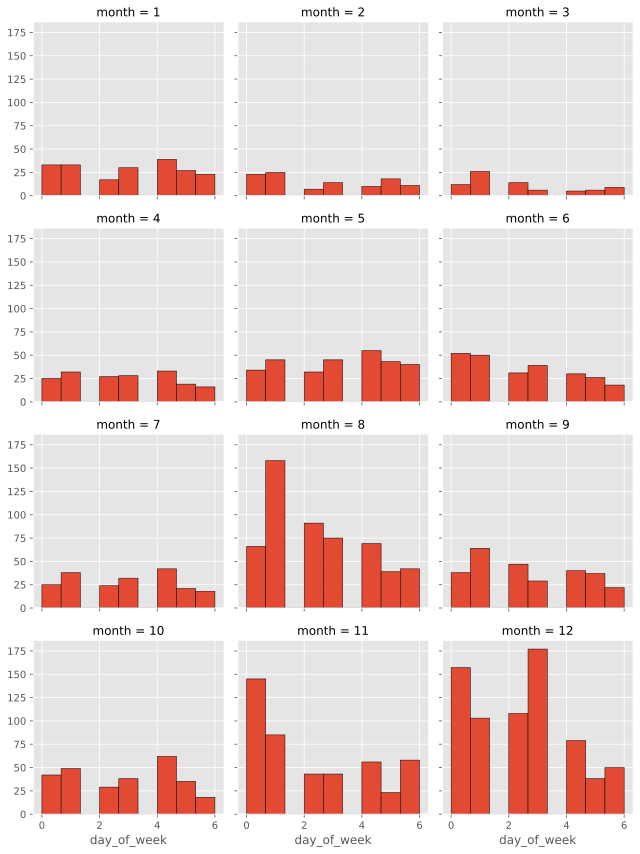

In [ ]:
bins = np.linspace(sdf.day_of_week.min(), sdf.day_of_week.max(), 10)
g = sns.FacetGrid(sdf, col='month',col_wrap=3)
g.map(plt.hist, 'day_of_week', bins=bins, ec="k")
plt.show()

Some things we can see from the above diagram is that most people are ordering on saturdays, and starting from September, the order increase. Now we can explore what are the items ordered.

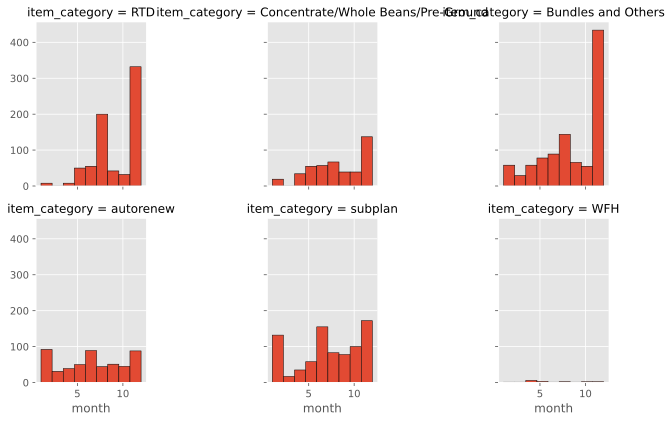

In [ ]:
bins = np.linspace(sdf.month.min(), sdf.month.max(), 10)
g = sns.FacetGrid(sdf, col='item_category',col_wrap=3)
g.map(plt.hist, 'month', bins=bins, ec="k")
#g.axes[-1].legend()
plt.show()

In [ ]:
sdf = pd.concat([sdf,pd.get_dummies(sdf['item_category'])], axis=1)
#sdf.drop(['subplan','WFH','RTD','autorenew','Paid at'], axis = 1,inplace=True)
sdf.head()

,Name,postal_code,item_category,Paid at,date,year,month,day_of_week,time_of_day,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan
0,#2835,670608,RTD,2020-08-25 08:33:10,2020-08-25,2020,8,1,8,0,0,1,0,0,0
7,#4183,018982,Concentrate/Whole Beans/Pre-Ground,2020-12-11 02:48:18,2020-12-11,2020,12,4,2,0,1,0,0,0,0
29,#2411,567696,Bundles and Others,2020-08-05 05:13:22,2020-08-05,2020,8,2,5,1,0,0,0,0,0
30,#4532,543211,Concentrate/Whole Beans/Pre-Ground,2020-12-28 02:04:23,2020-12-28,2020,12,0,2,0,1,0,0,0,0
31,#4674,050532,RTD,2020-12-30 17:03:18,2020-12-30,2020,12,2,17,0,0,1,0,0,0


In [ ]:
#to find out frequency of each postal code making order to find which place frequents us the most.
col = sdf.columns[9:]
tot_delivery = sdf.groupby(sdf['postal_code'])[col].sum().reset_index()
tot_delivery.head()

,postal_code,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan
0,018982,12,2,5,0,0,0
1,018985,0,1,0,0,6,0
2,018987,1,0,0,0,7,0
3,039596,1,0,0,0,0,0
4,050531,2,0,0,0,0,0


In [ ]:
shpdf = pd.DataFrame(tot_delivery)

In [ ]:
shpdf.dtypes

postal_code                           object
Bundles and Others                     uint8
Concentrate/Whole Beans/Pre-Ground     uint8
RTD                                    uint8
WFH                                    uint8
autorenew                              uint8
subplan                                uint8
dtype: object

In [ ]:
#look for way to get first element in series, return value to variable lat and append to list
slat = []
slng = []
for p in shpdf['postal_code']:

  lat = postcode_df.loc[postcode_df['NEW_POSTAL'] == p,'LATITUDE']
  lng = postcode_df.loc[postcode_df['NEW_POSTAL'] == p,'LONGITUDE']
  if len(lat) <1 :
    lat = None
    lng = None
    slat.append(lat)
    slng.append(lng)
  else :
    slat.append(lat.iloc[0])
    slng.append(lng.iloc[0])
shpdf['lat'] = slat
shpdf['lng'] = slng
shpdf.head()

,postal_code,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,lat,lng
0,018982,12,2,5,0,0,0,1.279125,103.854458
1,018985,0,1,0,0,6,0,1.280769,103.852659
2,018987,1,0,0,0,7,0,1.280769,103.852659
3,039596,1,0,0,0,0,0,1.292080,103.859972
4,050531,2,0,0,0,0,0,1.284149,103.845704


There are a lot of data points to mark on the map. So to make sense of it, some form of machine learning would have to be applied. For the next portion, k-Means Clustering is chosen to do some clustering of the postal locations.

### Modeling to Evaluation <a name="modeleval"></a>

For this problem, I will be using K Means Clustering to cluster all the locations of the customers first.

First, I will cluster them, and then from there search within these clusters to source out cafes within those clusters. 

What I hope to be able to find from this is clusters that are potentially the most likely to make orders from Bev Company, and find the most ideal cloud kitchen facility to serve that area.

#### k Means Clustering

Convert lat/lng data into geometry points, to find the district they belong to.

In [ ]:
from shapely.geometry import Point, Polygon, MultiPolygon

In [ ]:
shpdf.isna().any()

postal_code                           False
Bundles and Others                    False
Concentrate/Whole Beans/Pre-Ground    False
RTD                                   False
WFH                                   False
autorenew                             False
subplan                               False
lat                                    True
lng                                    True
dtype: bool

In [ ]:
print(f'Before dropping NaNs \t:\tshpdf.shape = {shpdf.shape}')
shpdf.dropna(inplace=True)
print(f'After dropping NaNs \t:\tshpdf.shape = {shpdf.shape}')

Before dropping NaNs 	:	shpdf.shape = (1775, 9)
After dropping NaNs 	:	shpdf.shape = (1766, 9)


In [ ]:
# creating a geometry column 
geometry = [Point(xy) for xy in zip(shpdf['lng'], shpdf['lat'])]

# Coordinate reference system : WGS84
crs = {'init': 'epsg:4326'}

# Creating a Geographic data frame 
gdf = gpd.GeoDataFrame(shpdf, crs=crs, geometry=geometry)

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [ ]:
gdf.head()

,postal_code,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,lat,lng,geometry
0,018982,12,2,5,0,0,0,1.279125,103.854458,POINT (103.85446 1.27913)
1,018985,0,1,0,0,6,0,1.280769,103.852659,POINT (103.85266 1.28077)
2,018987,1,0,0,0,7,0,1.280769,103.852659,POINT (103.85266 1.28077)
3,039596,1,0,0,0,0,0,1.292080,103.859972,POINT (103.85997 1.29208)
4,050531,2,0,0,0,0,0,1.284149,103.845704,POINT (103.84570 1.28415)


Using shapely point in polygon function `.contains()` to identify which polygon the datapoint belongs to

In [ ]:
dist_n = np.zeros(gdf.shape[0], dtype = str).tolist()
geom_n = np.zeros(gdf.shape[0], dtype = str).tolist()
idx = 0
#print(dist_n)
for geopoint in gdf['geometry']:
  #print('index geopoint', idx)
  ix = 0
  for poly in mdf['geometry']:
    #print(mdf['plan_area_name'].iloc[ix])
    if type(poly) == MultiPolygon: 
      #print('current mdf index', ix, 'contains multipolygon')
      ix+=1
      continue
    if poly.contains(geopoint) is True :
      dist = mdf['plan_area_name'].iloc[ix]
      geom = mdf['geometry'].iloc[ix]
      #print(dist)
      dist_n[idx] = dist
      geom_n[idx] = geom
      #print('current mdf index',ix,'geopoint found', dist)
      break
      #district = mdf.loc[mdf['geometry'] == poly,'plan_area_name'].iloc[0]
      #print(district)
    else :
      ix+=1
      continue
  idx+=1
print(len(dist_n))

1766


In [ ]:
gdf['district']=dist_n
gdf['planning_area_geometry']=geom_n
gdf.head()

,postal_code,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,lat,lng,geometry,district,planning_area_geometry
0,018982,12,2,5,0,0,0,1.279125,103.854458,POINT (103.85446 1.27913),DOWNTOWN CORE,POLYGON Z ((103.855213569956 1.28322007396092 ...
1,018985,0,1,0,0,6,0,1.280769,103.852659,POINT (103.85266 1.28077),DOWNTOWN CORE,POLYGON Z ((103.855213569956 1.28322007396092 ...
2,018987,1,0,0,0,7,0,1.280769,103.852659,POINT (103.85266 1.28077),DOWNTOWN CORE,POLYGON Z ((103.855213569956 1.28322007396092 ...
3,039596,1,0,0,0,0,0,1.292080,103.859972,POINT (103.85997 1.29208),DOWNTOWN CORE,POLYGON Z ((103.863449045972 1.29386684814248 ...
4,050531,2,0,0,0,0,0,1.284149,103.845704,POINT (103.84570 1.28415),OUTRAM,POLYGON Z ((103.848588740258 1.28231676672922 ...


In [ ]:
#gdf.to_csv('/content/drive/MyDrive/Bettr/Capstone project/shopifygdf.csv')

Plot out the point on a scatter plot to see how they are clustered by district

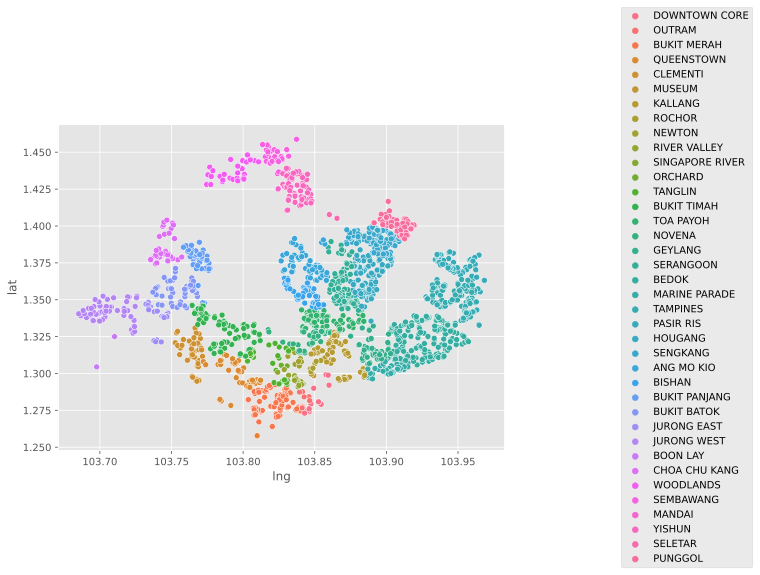

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
sns.scatterplot(x='lng', y='lat', hue='district', data=gdf).legend(loc='center left', bbox_to_anchor=(1.25, 0.5), ncol=1) 
plt.show()

Next, we want to find out how many clusters there are within this dataset. So using the "Elbow Method", we can find which k value we should use.

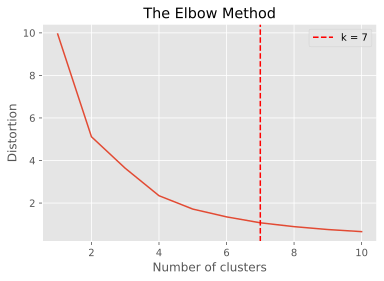

In [ ]:
X = gdf[["lat","lng"]]
max_k = 10
## iterations
distortions = [] 
for i in range(1, max_k+1):
    if len(X) >= i:
       model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
       model.fit(X)
       distortions.append(model.inertia_)
## best k: the lowest derivative
k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i 
     in np.diff(distortions,2)]))
## plot
fig, ax = plt.subplots()
ax.plot(range(1, len(distortions)+1), distortions)
ax.axvline(k, ls='--', color="red", label="k = "+str(k))
ax.set(title='The Elbow Method', xlabel='Number of clusters', 
       ylabel="Distortion")
ax.legend()
ax.grid(True)
plt.show()

In [ ]:
k = 7
model = cluster.KMeans(n_clusters=k, init='k-means++')
X = gdf[["lat","lng"]]
## clustering
dtf_X = X.copy()
dtf_X["cluster"] = model.fit_predict(X)
## find real centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                     dtf_X.drop("cluster", axis=1).values)
dtf_X["centroids"] = 0
for i in closest:
    dtf_X["centroids"].iloc[i] = 1
## add clustering info to the original dataset
gdf[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]
gdf.sample(5)

/usr/local/lib/python3.6/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


,postal_code,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,lat,lng,geometry,district,planning_area_geometry,cluster,centroids
441,359190,0,0,1,0,0,0,1.347627,103.868152,POINT (103.86815 1.34763),SERANGOON,POLYGON Z ((103.863509799309 1.35393106956263 ...,6,0
1355,611140,1,0,1,0,0,0,1.327355,103.723135,POINT (103.72313 1.32735),JURONG WEST,POLYGON Z ((103.724965981895 1.33203751738445 ...,2,0
1255,575728,0,0,1,0,0,0,1.360991,103.828974,POINT (103.82897 1.36099),BISHAN,POLYGON Z ((103.842632217239 1.36323471169518 ...,6,0
1149,552506,1,0,0,0,0,0,1.372474,103.875802,POINT (103.87580 1.37247),SERANGOON,POLYGON Z ((103.876993689675 1.37563776275109 ...,0,0
803,518211,0,0,1,0,0,0,1.371470,103.944466,POINT (103.94447 1.37147),PASIR RIS,POLYGON Z ((103.949037935188 1.3770324524511 0...,3,0


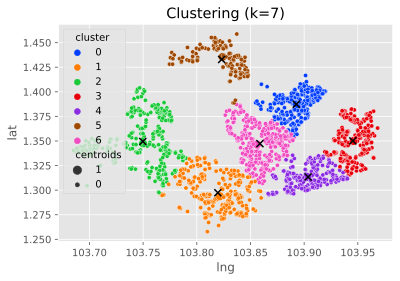

In [ ]:
## plot
fig, ax = plt.subplots()
sns.scatterplot(x="lng", y="lat", data=gdf, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend="brief", ax=ax).set_title('Clustering (k='+str(k)+')')
th_centroids = model.cluster_centers_
ax.scatter(th_centroids[:,1], th_centroids[:,0], s=50, c='black', 
           marker="x")

####Now to find the coordinates of the cluster centres, and the clusters that have the fewest cafe ammenties:

In [ ]:
th_centroids

array([[  1.38731323, 103.89269636],
       [  1.29736223, 103.81961502],
       [  1.34948583, 103.74971004],
       [  1.35008069, 103.94538509],
       [  1.31341551, 103.90367315],
       [  1.43287956, 103.823163  ],
       [  1.34729374, 103.85880791]])

With these centroid locations, I would like to find out all the F&B outlets in the area that serve specialty coffee. So I will now use the Foursquare API to locate them.

In [ ]:
cent= pd.DataFrame(th_centroids)
cent.rename(columns={0:'lat',1:'lng'},inplace=True)
cent['cluster']=[0,1,2,3,4,5,6]
cent

,lat,lng,cluster
0,1.387313,103.892696,0
1,1.297362,103.819615,1
2,1.349486,103.749710,2
3,1.350081,103.945385,3
4,1.313416,103.903673,4
5,1.432880,103.823163,5
6,1.347294,103.858808,6


In [ ]:
# creating a geometry column 
geometry = [Point(xy) for xy in zip(cent['lng'], cent['lat'])]

# Coordinate reference system : WGS84
crs = {'init': 'epsg:4326'}

# Creating a Geographic data frame 
centgdf = gpd.GeoDataFrame(cent, crs=crs, geometry=geometry)
centgdf

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,lat,lng,cluster,geometry
0,1.387313,103.892696,0,POINT (103.89270 1.38731)
1,1.297362,103.819615,1,POINT (103.81962 1.29736)
2,1.349486,103.749710,2,POINT (103.74971 1.34949)
3,1.350081,103.945385,3,POINT (103.94539 1.35008)
4,1.313416,103.903673,4,POINT (103.90367 1.31342)
5,1.432880,103.823163,5,POINT (103.82316 1.43288)
6,1.347294,103.858808,6,POINT (103.85881 1.34729)


Create polygons out of cluster geometry points
Create each polygon cluster first, to be as convex as possible.
Then search each polygon for the geometry point of cafes.
If the point exists in the polygon, sum it.

In [ ]:
import cartopy.crs as ccrs

In [ ]:
c = {}
for i in range(7):
  clusterpolydf = gdf.loc[gdf['cluster']==i,'geometry']
  c[i]=clusterpolydf

In [ ]:
#clalpha1 = [0.00091,0.00085,0.00104,0.0013,0.000945,0.001679,0.000815]

In [ ]:
cl_dict = {}
clalpha =[]

In [ ]:
# To Generate a list of optimised Alphas
for i in range(7):
  print('Starting for cluster', i)
  clusterpoly = gdf.loc[gdf['cluster']==i,'geometry']
  gdf_proj = clusterpoly.to_crs(ccrs.AlbersEqualArea().proj4_init)
  a = alphashape.optimizealpha(gdf_proj)
  clalpha.append(a)
  print('Cluster',i,'complete')
print('Done')

Starting for cluster 0
Cluster 0 complete
Starting for cluster 1
Cluster 1 complete
Starting for cluster 2
Cluster 2 complete
Starting for cluster 3
Cluster 3 complete
Starting for cluster 4
Cluster 4 complete
Starting for cluster 5
Cluster 5 complete
Starting for cluster 6
Cluster 6 complete
Done


In [ ]:
#Getting alpha shape for each cluster using the optimised alphas
for i in range(7):
  print('Starting for cluster', i)
  poly=c[i]
  #print(poly, clalpha1[i])
  alpha_shape = alphashape.alphashape(poly,clalpha[i])
  cl_dict[i] = alpha_shape
  print('Cluster',i,'complete')
print('Done')

Starting for cluster 0
Cluster 0 complete
Starting for cluster 1
Cluster 1 complete
Starting for cluster 2
Cluster 2 complete
Starting for cluster 3
Cluster 3 complete
Starting for cluster 4
Cluster 4 complete
Starting for cluster 5
Cluster 5 complete
Starting for cluster 6
Cluster 6 complete
Done


In [ ]:
clusdf = pd.DataFrame.from_dict(cl_dict, orient='index', columns=['geometry'])
clusdf['cluster']=[0,1,2,3,4,5,6]
clusterGeoDF = gpd.GeoDataFrame(clusdf,crs=crs)
clusterGeoDF

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,geometry,cluster
0,"POLYGON ((103.89329 1.35684, 103.89048 1.35597...",0
1,"POLYGON ((103.84621 1.27386, 103.80980 1.25780...",1
2,"POLYGON ((103.76479 1.29750, 103.69774 1.30446...",2
3,"POLYGON ((103.95731 1.32156, 103.94270 1.31570...",3
4,"POLYGON ((103.89031 1.29630, 103.86715 1.29546...",4
5,"POLYGON ((103.83478 1.38872, 103.83379 1.38874...",5
6,"POLYGON ((103.86124 1.30695, 103.85825 1.30777...",6


In [ ]:
clusterGeoDF.dtypes

geometry    geometry
cluster        int64
dtype: object

In [ ]:
ply = []
for i,geodf in cl_dict.items():
  
  a = clalpha[i]
  alpha_shape = alphashape.alphashape(geodf,alpha=a)
  ply.append(alpha_shape)
centgdf['polygon']=ply

In [ ]:
centgdf['polygon']=centgdf['polygon'].astype('geometry')

In [ ]:
cgjdf = centgdf[['cluster','polygon']].copy()
cgjdf

###### Manually adjusting polygons

In [ ]:
a = 0.0009100709653165797
alpha_shape_t = alphashape.alphashape(cl_dict[0],alpha=a)
type(alpha_shape_t)

In [ ]:
clalpha1 = [0.00091,0.00085,0.00104,0.0013,0.000945,0.001679,0.000815]
ply1 = []
for i,geodf in cl_dict.items():
  
  a = clalpha1[i]
  alpha_shape1 = alphashape.alphashape(geodf,alpha=a)
  ply1.append(alpha_shape1)
centgdf['polygon_1']=ply1

In [ ]:
#centgdf

In [ ]:
#centgdf['polygon_1']=centgdf['polygon_1'].astype('geometry')

In [ ]:
#clusterjsondf = centgdf[['cluster','polygon_1']].copy()
#clusterjsondf.rename(columns={'polygon_1':'geometry','cluster':'cluster_name'},inplace=True)
#clusterjsondf

In [ ]:
#clusterjson = gpd.GeoDataFrame(clusterjsondf, crs="EPSG:4326")
#clusterjson

In [ ]:
import fiona

In [ ]:
#clusterjson.to_file('/content/drive/MyDrive/Bettr/Capstone project/clusterpolygons.geojson',driver='GeoJSON')

In [ ]:
#cgdf=gpd.read_file('/content/drive/MyDrive/Bettr/Capstone project/clusterpolygons.geojson')
#type(cgdf)

In [ ]:
# define the another singapore map for clusters
sgclustermap = folium.Map(location=[1.28967, 103.85007], zoom_start=11)

In [ ]:
folium.GeoJson(clusterGeoDF).add_to(sgclustermap)
sgclustermap

#### With new polygon coordinates
We will later use them to count how many cafes fall within each polygon.

#### Now mapping the above clusters onto singapore map

In [ ]:
#Create cluster map with centroids with circle for search radius
sgcluster_map = folium.Map(location=[1.28967, 103.85007], zoom_start=11)


In [ ]:
# define the another singapore map for clusters
sg_map = folium.Map(location=[1.28967, 103.85007], zoom_start=11)

In [ ]:
#del sg_map

In [ ]:
latitudes = list(gdf.lat)
longitudes = list(gdf.lng)
district = list(gdf.district)
cluster = list(gdf.cluster)

# set color scheme for the clusters
x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map for clusters
markers_colors = []
for lat, lon, poi, cluster in zip(latitudes, longitudes, district, cluster):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(sgclustermap)
       
sgclustermap

Now I would like to see which cluster has the most number of customers

In [ ]:
gcol=gdf.columns[1:7]
cluster_devdf = gdf.groupby(['cluster'])[gcol].sum().reset_index()
#cluster_devdf.sort_values(by=['postal_code'],ascending=False,inplace=True)
cluster_devdf

,cluster,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan
0,0,150,63,122,1,26,100
1,1,226,81,89,2,161,98
2,2,165,54,134,3,96,67
3,3,113,79,94,2,106,70
4,4,107,59,93,3,43,187
5,5,54,38,53,5,34,117
6,6,193,73,140,3,53,184


In [ ]:
cluster_post = gdf.groupby(['cluster'])['postal_code'].count().reset_index()

#highest frequency of orders in each cluster
ord_freq = cluster_devdf.merge(cluster_post, left_index=True, right_index=True)
ord_freq.drop(columns=['cluster_y'], inplace=True)
ord_freq.rename(columns={'cluster_x':'cluster'}, inplace=True)
ord_freq

,cluster,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,postal_code
0,0,150,63,122,1,26,100,279
1,1,226,81,89,2,161,98,272
2,2,165,54,134,3,96,67,295
3,3,113,79,94,2,106,70,235
4,4,107,59,93,3,43,187,218
5,5,54,38,53,5,34,117,126
6,6,193,73,140,3,53,184,341


In [ ]:
ord_freq['total_orders']=ord_freq[['Bundles and Others',	'Concentrate/Whole Beans/Pre-Ground',	'RTD',	'WFH',	'autorenew',	'subplan']].sum(axis=1)
ord_freq.rename(columns={'postal_code':'num_of_postal_code_locations'}, inplace=True)
#ord_freq.sort_values(by=['volume_of_orders'],ascending=False,inplace=True)
ord_freq

,cluster,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,num_of_postal_code_locations,total_orders
0,0,150,63,122,1,26,100,279,462
1,1,226,81,89,2,161,98,272,657
2,2,165,54,134,3,96,67,295,519
3,3,113,79,94,2,106,70,235,464
4,4,107,59,93,3,43,187,218,492
5,5,54,38,53,5,34,117,126,301
6,6,193,73,140,3,53,184,341,646


##### Create cluster map with centroids with circle for search radius

In [ ]:
latitudes = list(centgdf.lat)
longitudes = list(centgdf.lng)
tooltip = list(centgdf.geometry)
latitudes1 = list(gdf.lat)
longitudes1 = list(gdf.lng)
district = list(gdf.district)
cluster = list(gdf.cluster)

# set color scheme for the clusters
x = np.arange(k)
ys = [i + x + (i*x)**2 for i in range(k)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat1, lon1, poi, cluster in zip(latitudes1, longitudes1, district, cluster):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat1, lon1],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(sgcluster_map)
# add markers to map
for lat, lng, tooltip in zip(latitudes, longitudes, tooltip):
    folium.Circle(
        [lat, lng],
        radius=7000,
        tooltip=tooltip
        ).add_to(sgcluster_map)
sgcluster_map

From the above map, there are many overlapping circles. What I will do after getting all the ammenties, is to drop all duplicates. Then I will map it again on the map

#### Foursquare API
Now using the Foursquare API, I will check each centroid location and search for cafes in the area using Foursquare's `categoryId` search variable

In [ ]:
cafecatid = '4bf58dd8d48988d16d941735'
radius = 7000
#latitude = '1.347262'	
#longitude = '103.858736'

In [ ]:
#url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude,ACCESS_TOKEN, VERSION, cafecatid, radius, LIMIT)
#results = requests.get(url).json()
  # assign relevant part of JSON to venues
#venues = results['response']['venues']
  
  # tranform venues into a dataframe
#dataframe = json_normalize(venues)
#dataframe.head()

In [ ]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [ ]:
clusterdf = dict()
for i, row in cent.iterrows():
  latitude = row.lat
  longitude = row.lng
  centnum = i
  #print(latitude, longitude, i)
  url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude,ACCESS_TOKEN, VERSION, cafecatid, radius, LIMIT)
  results = requests.get(url).json()
  # assign relevant part of JSON to venues
  venues = results['response']['venues']
  
  # tranform venues into a dataframe
  dataframe = json_normalize(venues)
  # keep only columns that include venue name, and anything that is associated with location
  filtered_columns = ['name', 'categories'] + [col for col in dataframe.columns if col.startswith('location.')] + ['id']
  dataframe_filtered = dataframe.loc[:, filtered_columns]
  # filter the category for each row
  dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

  # clean column names by keeping only last term
  dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]

  dataframe_filtered.drop(columns=['labeledLatLngs','cc','city','state','neighborhood','id'],inplace=True)
  clusterdf[i] = dataframe_filtered

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:13: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  del sys.path[0]


In [ ]:
#assigning dictionary values to dataframes
cluster_0 = clusterdf[0]
cluster_1 = clusterdf[1] 
cluster_2 = clusterdf[2]
cluster_3 = clusterdf[3]
cluster_4 = clusterdf[4]
cluster_5 = clusterdf[5]
cluster_6 = clusterdf[6]

In [ ]:
cluster_0.shape

(50, 10)

In [ ]:
cluster_0['cluster_num'] = 0
cluster_1['cluster_num'] = 1
cluster_2['cluster_num'] = 2
cluster_3['cluster_num'] = 3
cluster_4['cluster_num'] = 4
cluster_5['cluster_num'] = 5
cluster_6['cluster_num'] = 6

In [ ]:
mastercdf = cluster_0.append(cluster_1,ignore_index=True)

In [ ]:
temp1 = cluster_2.append(cluster_3,ignore_index=True)
temp1.shape

(100, 11)

In [ ]:
temp2 = cluster_4.append(cluster_5,ignore_index=True)
temp2.shape

(100, 11)

In [ ]:
temp3 = temp2.append(cluster_6,ignore_index=True)
temp3.shape

(150, 11)

In [ ]:
temp4 = temp1.append(temp3,ignore_index=True)
temp4.shape

(250, 11)

In [ ]:
mcdf=mastercdf.append(temp4,ignore_index=True)
mcdf.shape

(350, 11)

In [ ]:
mcdf['country'].unique()

array(['Singapore', 'Malaysia'], dtype=object)

In [ ]:
# get names of indexes for which 
# column country has value Malaysia 
index_names = mcdf[ mcdf['country'] == 'Malaysia' ].index 
  
# drop these row indexes 
# from dataFrame 
mcdf.drop(index_names, inplace = True) 
mcdf.shape

(342, 11)

In [ ]:
geometry1 = [Point(xy) for xy in zip(mcdf.lng, mcdf.lat)]
mcgdf = gpd.GeoDataFrame(mcdf, crs="EPSG:4326", geometry=geometry1)
mcgdf

,name,categories,address,crossStreet,lat,lng,distance,postalCode,country,formattedAddress,cluster_num,geometry
0,Ya Kun Family Cafe,Café,"#01-37, Compass One",1 Sengkang Sq.,1.391903,103.894913,567,545078,Singapore,"[#01-37, Compass One (1 Sengkang Sq.), 545078]",0,POINT (103.89491 1.39190)
1,Kueh & Mee,Deli / Bodega,Yishun ave 2 #01-167,Northpoint,1.428563,103.835612,7838,760923,Singapore,"[Yishun ave 2 #01-167 (Northpoint), 760923]",0,POINT (103.83561 1.42856)
2,The Larder Cafe,Café,NaN,NaN,1.364304,103.865715,3946,555958,Singapore,[555958],0,POINT (103.86571 1.36430)
3,6 Letter Coffee,Café,259 Tanjong Katong Road,NaN,1.307937,103.895355,8841,437047,Singapore,"[259 Tanjong Katong Road, 437047]",0,POINT (103.89535 1.30794)
4,Cottontail Creamery,Café,"Blk 326 Serangoon Ave 3, #01-378",NaN,1.350244,103.869211,4884,550326,Singapore,"[Blk 326 Serangoon Ave 3, #01-378, 550326]",0,POINT (103.86921 1.35024)
...,...,...,...,...,...,...,...,...,...,...,...,...
345,Craftsmen Specialty Coffee,Café,6 Eu Tong Sen Street,6 Eu Tong Sen Street,1.288444,103.846703,6688,059817,Singapore,"[6 Eu Tong Sen Street (6 Eu Tong Sen Street), ...",6,POINT (103.84670 1.28844)
346,Little Farms,Organic Grocery,#01-20 Valley Point,491 River Valley Road,1.293161,103.826746,7003,248371,Singapore,"[#01-20 Valley Point (491 River Valley Road), ...",6,POINT (103.82675 1.29316)
347,Chye Seng Huat Hardware Coffee Bar,Coffee Shop,150 Tyrwhitt Rd,NaN,1.311675,103.860374,3968,207563,Singapore,"[150 Tyrwhitt Rd, 207563]",6,POINT (103.86037 1.31168)
348,Sarnies,Sandwich Place,136 Telok Ayer St,NaN,1.281529,103.848117,7416,NaN,Singapore,[136 Telok Ayer St],6,POINT (103.84812 1.28153)


#### Plotting Cafes on the map
Now I'd like to plot all the cafes on the map to see where they overlap with the clusters

In [ ]:
latitudesC = list(mcdf.lat)
longitudesC = list(mcdf.lng)
cafename = list(mcdf.name)

# add markers to map
for lat, lng, label in zip(latitudesC, longitudesC, cafename):
    label = folium.Popup(label)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='black',
        fill=True,
        fill_color='#696969',
        fill_opacity=1,
        parse_html=False).add_to(sg_map)  


In [ ]:
folium.GeoJson(clusterGeoDF
               ).add_to(sg_map)


In [ ]:
sg_map

Visually, it can be hard to see the cafes in the clusters. So next what I will do is to use the polygons that was previous drawn using Alphashape, now we will map to see how many cafes are there within each cluster polygon.

In [ ]:
cafe_c = 0
idx = 0
cafes_cluster = []
for poly in clusterGeoDF['geometry']:
  #print(poly)
  for point in mcgdf['geometry']:
    result = point.within(poly)
    #print(result)
    if result is True :
      cafe_c+=1
    else :
      continue
  cafes_cluster.append(cafe_c)
  print('cluster ',idx,'has ',cafe_c, 'cafes')
  idx+=1
ord_freq['total_num_cafes']=cafes_cluster


cluster  0 has  36 cafes
cluster  1 has  159 cafes
cluster  2 has  192 cafes
cluster  3 has  205 cafes
cluster  4 has  227 cafes
cluster  5 has  249 cafes
cluster  6 has  306 cafes


In [ ]:
ord_freq

,cluster,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,num_of_postal_code_locations,total_orders,total_num_cafes
0,0,150,63,122,1,26,100,279,462,36
1,1,226,81,89,2,161,98,272,657,159
2,2,165,54,134,3,96,67,295,519,192
3,3,113,79,94,2,106,70,235,464,205
4,4,107,59,93,3,43,187,218,492,227
5,5,54,38,53,5,34,117,126,301,249
6,6,193,73,140,3,53,184,341,646,306


In [ ]:
ord_freq['cafe_postal_ratio']=ord_freq['num_of_postal_code_locations']/ord_freq['total_num_cafes']
ord_freq

,cluster,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,num_of_postal_code_locations,total_orders,total_num_cafes,cafe_postal_ratio
0,0,150,63,122,1,26,100,279,462,36,7.750000
1,1,226,81,89,2,161,98,272,657,159,1.710692
2,2,165,54,134,3,96,67,295,519,192,1.536458
3,3,113,79,94,2,106,70,235,464,205,1.146341
4,4,107,59,93,3,43,187,218,492,227,0.960352
5,5,54,38,53,5,34,117,126,301,249,0.506024
6,6,193,73,140,3,53,184,341,646,306,1.114379


Comparing to the above table, it seems that clusters 0, 1, 2 might be under served areas. 

To example about the calculation, it's an estimate to get a rough sense for every cafe, how many postal locations can be serviced.

A more accurate way to check would be to check for the spread of cafes within each cluster to the existing customers, to see which cluster has the furthest distance between customers and existing cafes.

#### Cloud Kitchen Locations

In [ ]:
cloudkitchen = pd.read_csv('/content/drive/MyDrive/Bettr/Capstone project/cloudkitchen.csv')
cloudkitchen.head()

,name,company,location,road,unit,postal_code,postal_sector
0,The Orchard Food Market,Smart City Kitchen,Orchard Towers,1 Claymore Drive,#02-01,229594,22
1,Woodlands Food Express,Smart City Kitchen,Nordcom II,2 Gambas Cres,NaN,757044,75
2,Central Food Court,Smart City Kitchen,Cross Street Exchange,18 Cross Street,#B1-110,48423,4
3,Tampines Food Co,Smart City Kitchen,JTC Space,10 Tampines North Drive 4,#01-05,528553,52
4,Clementi Collective,Smart City Kitchen,Tic Tech Centre,25 Pandan Cres,Basement,128477,12


In [ ]:
cloudkitchen['postal_code']=cloudkitchen['postal_code'].astype(str)

In [ ]:
postal_reform = []
for p in cloudkitchen['postal_code']:
  if len(p) < 6:
    p1 = list(p)
    p1.insert(0,'0')
    p2 = ''.join(p1)
    postal_reform.append(p2)
  else:
    postal_reform.append(p)
cloudkitchen['postal_code']=postal_reform
cloudkitchen.head()

,name,company,location,road,unit,postal_code,postal_sector
0,The Orchard Food Market,Smart City Kitchen,Orchard Towers,1 Claymore Drive,#02-01,229594,22
1,Woodlands Food Express,Smart City Kitchen,Nordcom II,2 Gambas Cres,NaN,757044,75
2,Central Food Court,Smart City Kitchen,Cross Street Exchange,18 Cross Street,#B1-110,048423,4
3,Tampines Food Co,Smart City Kitchen,JTC Space,10 Tampines North Drive 4,#01-05,528553,52
4,Clementi Collective,Smart City Kitchen,Tic Tech Centre,25 Pandan Cres,Basement,128477,12


Get Geolocation data of cloud kitchen

In [ ]:
latcode = []
lngcode = []
for p in cloudkitchen['postal_code']:

  lat = postcode_df.loc[postcode_df['NEW_POSTAL'] == p,'LATITUDE']
  lng = postcode_df.loc[postcode_df['NEW_POSTAL'] == p,'LONGITUDE']
  if len(lat) <1 :
    lat = 0
    lng = 0
    latcode.append(lat)
    lngcode.append(lng)
  else :
    latcode.append(lat.iloc[0])
    lngcode.append(lng.iloc[0])
cloudkitchen['lat'] = latcode
cloudkitchen['lng'] = lngcode
cloudkitchen.head()

,name,company,location,road,unit,postal_code,postal_sector,lat,lng
0,The Orchard Food Market,Smart City Kitchen,Orchard Towers,1 Claymore Drive,#02-01,229594,22,1.307546,103.829454
1,Woodlands Food Express,Smart City Kitchen,Nordcom II,2 Gambas Cres,NaN,757044,75,1.443185,103.815769
2,Central Food Court,Smart City Kitchen,Cross Street Exchange,18 Cross Street,#B1-110,048423,4,1.283504,103.846939
3,Tampines Food Co,Smart City Kitchen,JTC Space,10 Tampines North Drive 4,#01-05,528553,52,1.365601,103.931732
4,Clementi Collective,Smart City Kitchen,Tic Tech Centre,25 Pandan Cres,Basement,128477,12,1.307192,103.757510


Plotting cloud kitchen locations on map

In [ ]:
cloudkitchen['label'] = cloudkitchen.agg('{0[company]} at {0[location]}, {0[road]}{0[unit]}'.format, axis=1)
cloudkitchen

,name,company,location,road,unit,postal_code,postal_sector,lat,lng,label
0,The Orchard Food Market,Smart City Kitchen,Orchard Towers,1 Claymore Drive,#02-01,229594,22,1.307546,103.829454,"Smart City Kitchen at Orchard Towers, 1 Claymo..."
1,Woodlands Food Express,Smart City Kitchen,Nordcom II,2 Gambas Cres,NaN,757044,75,1.443185,103.815769,"Smart City Kitchen at Nordcom II, 2 Gambas Cre..."
2,Central Food Court,Smart City Kitchen,Cross Street Exchange,18 Cross Street,#B1-110,048423,4,1.283504,103.846939,"Smart City Kitchen at Cross Street Exchange, 1..."
3,Tampines Food Co,Smart City Kitchen,JTC Space,10 Tampines North Drive 4,#01-05,528553,52,1.365601,103.931732,"Smart City Kitchen at JTC Space, 10 Tampines N..."
4,Clementi Collective,Smart City Kitchen,Tic Tech Centre,25 Pandan Cres,Basement,128477,12,1.307192,103.757510,"Smart City Kitchen at Tic Tech Centre, 25 Pand..."
5,Hillview,GrabKitchen,Lam Soon Industrial Building,63 Hillview Ave,#6,669569,66,1.356874,103.763070,"GrabKitchen at Lam Soon Industrial Building, 6..."
6,Aljunied,GrabKitchen,Victory Centre,110 Lor 23 Geylang,#02-08,388410,38,1.318223,103.881453,"GrabKitchen at Victory Centre, 110 Lor 23 Geyl..."
7,Deliveroo Editions,Deliveroo,CT Hub 2,114 Lavender St,#01-15,338729,33,1.311476,103.863399,"Deliveroo at CT Hub 2, 114 Lavender St#01-15"
8,Deliveroo Editions-Katong,Deliveroo,Katong,332 Tanjong Katong Rd,NaN,437107,43,1.303962,103.896383,"Deliveroo at Katong, 332 Tanjong Katong Rdnan"


In [ ]:
latitudes = list(cloudkitchen.lat)
longitudes = list(cloudkitchen.lng)
labels = list(cloudkitchen.label)


# add markers to map
for lat, lng, label in zip(latitudes, longitudes, labels):
    label = folium.Popup(label)
    folium.Marker(
        [lat, lng],
        popup=label,
        ).add_to(sg_map)
        
sg_map

# Results <a name="res"></a>

Here we will look at all the things that was discovered in the above process, and we will make sense of the data and the results to make an informed decision of which cluster and potential cloud kitchen location that Bev Company could look in to for a future expansion location.

Map with clusters (hopefully as polygons)

In [ ]:
latitudes = list(cloudkitchen.lat)
longitudes = list(cloudkitchen.lng)
labels = list(cloudkitchen.label)


# add markers to map
for lat, lng, label in zip(latitudes, longitudes, labels):
    label = folium.Popup(label)
    folium.Marker(
        [lat, lng],
        popup=label,
        ).add_to(sgclustermap)

In [ ]:
sgclustermap

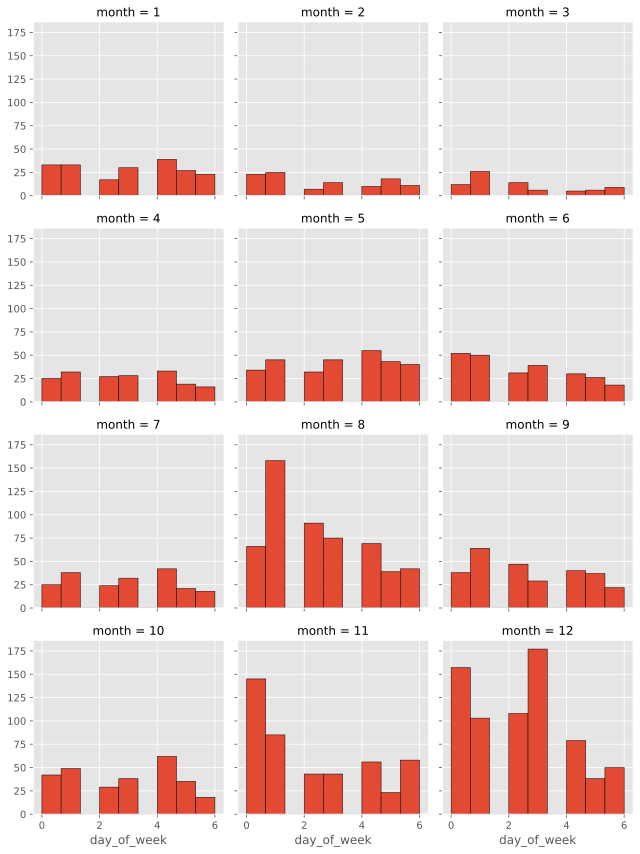

In [ ]:
bins = np.linspace(sdf.day_of_week.min(), sdf.day_of_week.max(), 10)
g = sns.FacetGrid(sdf, col='month',col_wrap=3)
g.map(plt.hist, 'day_of_week', bins=bins, ec="k")
plt.show()

As we saw from the above diagram is that most people are ordering on saturdays, and starting from September, the order increase.

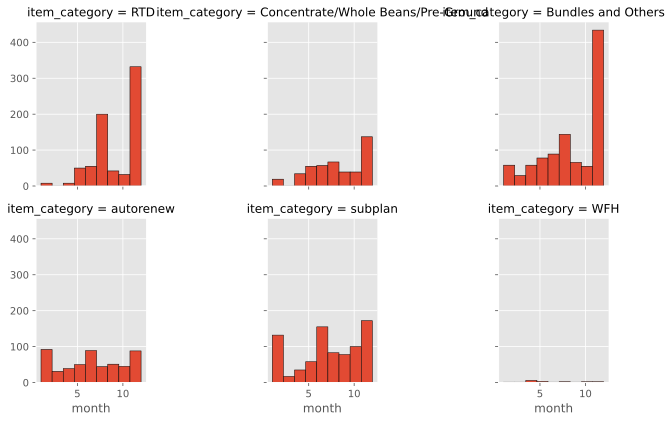

In [ ]:
bins = np.linspace(sdf.month.min(), sdf.month.max(), 10)
g = sns.FacetGrid(sdf, col='item_category',col_wrap=3)
g.map(plt.hist, 'month', bins=bins, ec="k")
#g.axes[-1].legend()
plt.show()

Chart or table with cluster information, avg num of cafes, avg num of deliveries, clusters with highest frequent demands.

In [ ]:
dataframe_final = ord_freq.set_index('cluster')

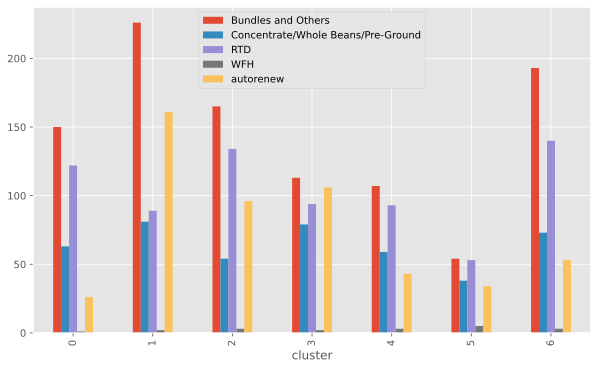

In [ ]:
colnm = dataframe_final.columns[0:5]
item_types = dataframe_final[['Bundles and Others', 'Concentrate/Whole Beans/Pre-Ground', 'RTD',
       'WFH', 'autorenew']].copy()
item_types.plot(kind='bar', figsize=(10,6))
plt.show()

Map with cloud kitchens plotted and cluster polygons

In [ ]:
sg_map

In [ ]:
# display world map
sg_map.add_child(cbar_cust)

In [ ]:
dataframe_final

,Bundles and Others,Concentrate/Whole Beans/Pre-Ground,RTD,WFH,autorenew,subplan,num_of_postal_code_locations,total_orders,total_num_cafes,cafe_postal_ratio
cluster,,,,,,,,,,
0,150,63,122,1,26,100,279,462,36,7.750000
1,226,81,89,2,161,98,272,657,159,1.710692
2,165,54,134,3,96,67,295,519,192,1.536458
3,113,79,94,2,106,70,235,464,205,1.146341
4,107,59,93,3,43,187,218,492,227,0.960352
5,54,38,53,5,34,117,126,301,249,0.506024
6,193,73,140,3,53,184,341,646,306,1.114379


# Discussion & Conclusion <a name="disc"></a>

Cluster 0 and 1 are side by side and can be serviced by the smart kitchen at JTC space. 
Based on the current subscribers, who seem to be focused in cluster 0, it would likely be the best choice given this initial study to establish a kitchen at:


Smart City Kitchen at JTC Space, 
10 Tampines North Drive 4 #01-05

This place that would likely meet the needs of Bev Company in reaching to new potential customers and also being able to better serve existing customers.

# References <a name="ref"></a>

* https://data.gov.sg/dataset/master-plan-2019-subzone-boundary-no-sea
* https://data.gov.sg/dataset/number-of-approved-applications-for-financial-assistance-measures-by-financial-year
* https://data.gov.sg/dataset/student-care-services
* https://data.gov.sg/dataset/social-service-offices
* https://github.com/xuancong84/singapore-address-heatmap

## Acknowledgements <a name="ack"></a>

## Appendix <a name="appendix"></a>